In [1]:
! hostname

c01


In [2]:
# enable autoreload
%load_ext autoreload
%autoreload 2

In [3]:
import os
import sys
import scanpy as sc
import squidpy as sq
import numpy as np
import pandas as pd
import torch
from anndata import AnnData
import anndata
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad

import matplotlib.colors as mcolors

from sklearn import metrics
import multiprocessing as mp
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import scipy.sparse as sp
import scipy.linalg

/share/home/liangzhongming/anaconda3/envs/cellniche/lib/python3.9/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


In [18]:
plt.rcParams['pdf.fonttype'] = 42
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=200,
                     dpi_save=300,
#                      facecolor='w',
#                      frameon=False, # frameon=True
#                      figsize=(4,4)
                    ) 
%config InlineBackend.figure_format='retina'
%matplotlib inline

scanpy==1.10.3 anndata==0.10.9 umap==0.5.9.post2 numpy==1.26.4 scipy==1.13.1 pandas==2.3.1 scikit-learn==1.6.1 statsmodels==0.14.5 igraph==0.11.9 pynndescent==0.5.13


In [4]:
adata_10m = sc.read_h5ad('/share/home/liangzhongming/phd_code/530/CellNiche/data/mergedBrain_10million.h5ad')

In [5]:
adata_10m

AnnData object with n_obs × n_vars = 10851748 × 2650
    obs: 'x', 'y', 'z', 'Main_molecular_cell_type', 'Sub_molecular_cell_type', 'Main_molecular_tissue_region', 'Sub_molecular_tissue_region', 'Molecular_spatial_cell_type', 'cell_id', 'class_label', 'class', 'class_bootstrapping_probability', 'subclass_label', 'subclass', 'subclass_bootstrapping_probability', 'supertype_label', 'supertype', 'supertype_bootstrapping_probability', 'cluster_label', 'cluster', 'cluster_alias', 'cluster_bootstrapping_probability', 'atlas', 'slice_id', 'leiden', 'brain_section_label_obs', 'brain_section_label_meta', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'neurotransmitter', 'subclass_confidence_score', 'cluster_confidence_score', 'high_quality_transfer', 'ccf_x', 'ccf_y', 'ccf_z', 'parcellation_index', 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'sample', 'Main_region_transferred_5nn', 'Sub_region_transferred_5nn'
    uns: 'spatial_fov', 

In [6]:
adata_10m.obsm['spatial_fov'] =adata_10m.obsm['spatial']

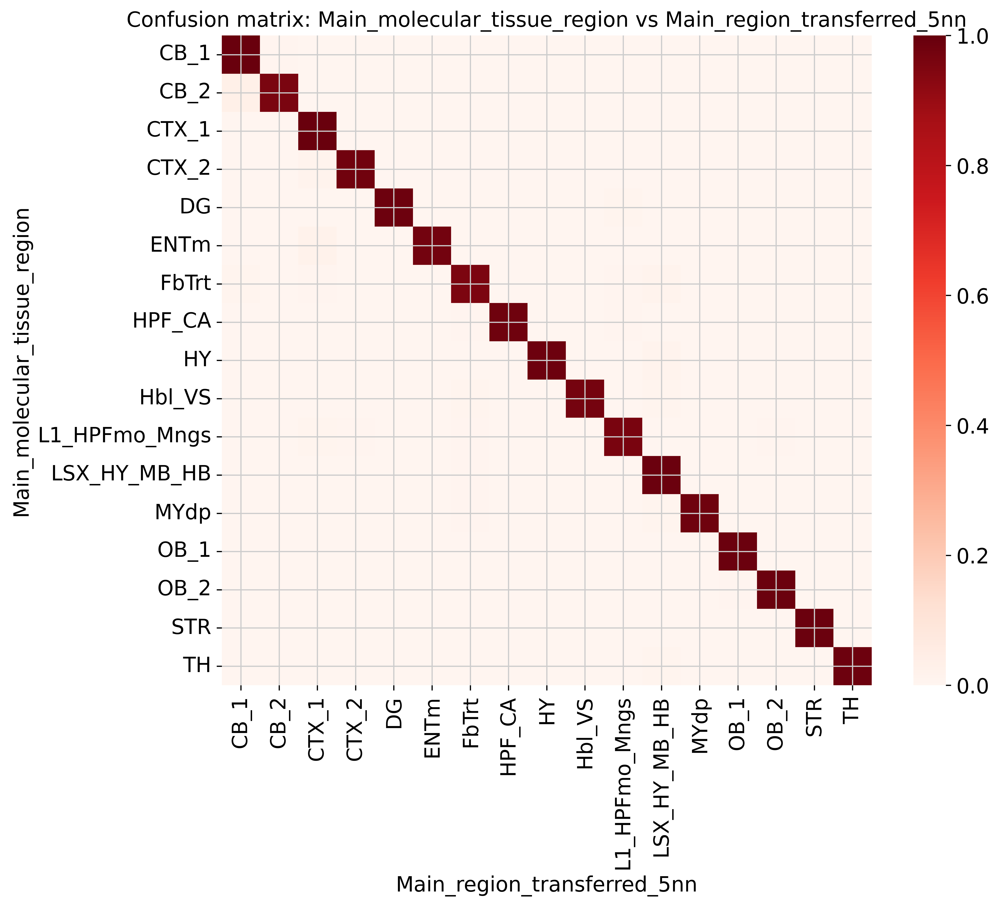

In [8]:
adata_a1 = adata_10m[adata_10m.obs['atlas'] == 'Atlas1'].copy()

df_conf = pd.crosstab(
    adata_a1.obs['Main_molecular_tissue_region'], 
    adata_a1.obs['Main_region_transferred_5nn']
)

df_conf_norm = df_conf.div(df_conf.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(
    df_conf_norm, 
    cmap='Reds',
    square=True, 
    annot=False,
    vmax=1.0
)
plt.title('Confusion matrix: Main_molecular_tissue_region vs Main_region_transferred_5nn')
plt.xlabel('Main_region_transferred_5nn')
plt.ylabel('Main_molecular_tissue_region')
plt.show()


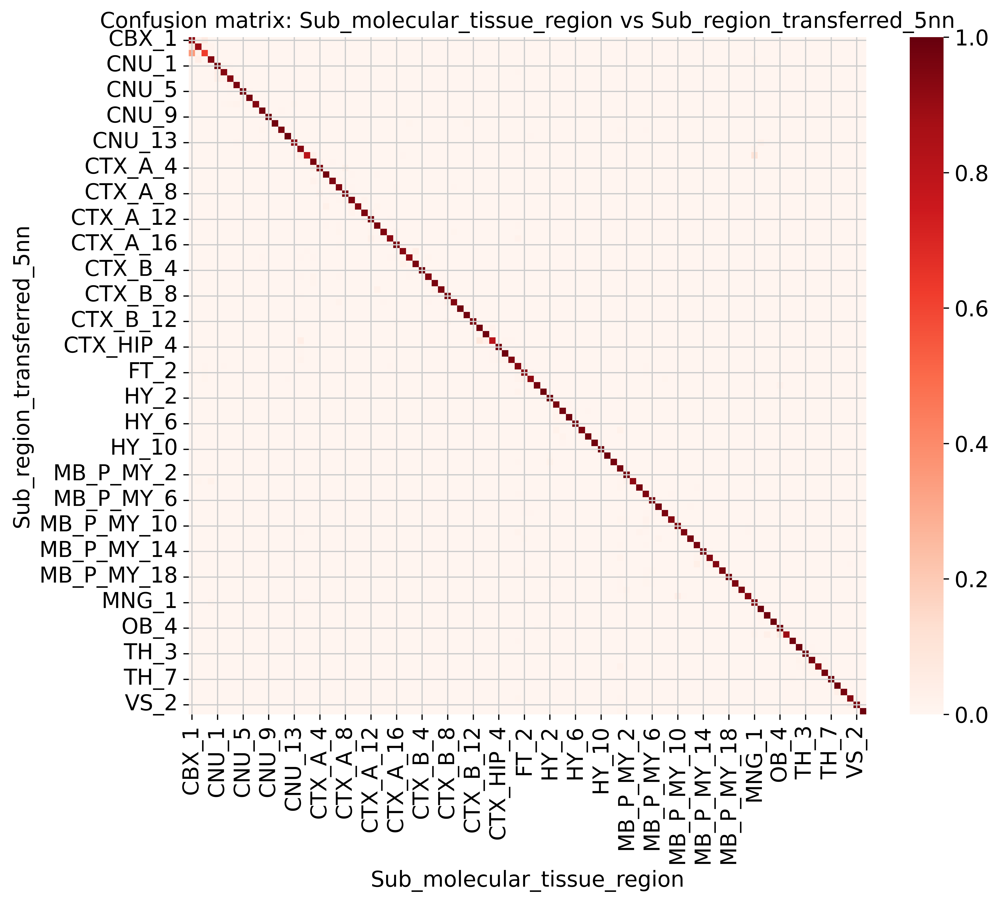

In [9]:
df_conf = pd.crosstab(
    adata_a1.obs['Sub_molecular_tissue_region'], 
    adata_a1.obs['Sub_region_transferred_5nn']
)

df_conf_norm = df_conf.div(df_conf.sum(axis=1), axis=0)

plt.figure(figsize=(10, 8))
sns.heatmap(
    df_conf_norm, 
    cmap='Reds',
    square=True, 
    annot=False,
    vmax=1.0
)
plt.title('Confusion matrix: Sub_molecular_tissue_region vs Sub_region_transferred_5nn')
plt.xlabel('Sub_molecular_tissue_region')
plt.ylabel('Sub_region_transferred_5nn')
plt.show()

## atlas1

In [7]:
atlas_ids = [s for s in adata_10m.obs["sample"].unique() if str(s).startswith("Atlas1")]
max_libs = 10 # Limited by the size of the file that can be rendered by GitHub
rng = np.random.default_rng(seed=42)
library_subset = rng.choice(
    atlas_ids,
    size=min(max_libs, len(atlas_ids)),
    replace=False,
).tolist()

### Main_molecular_tissue_region

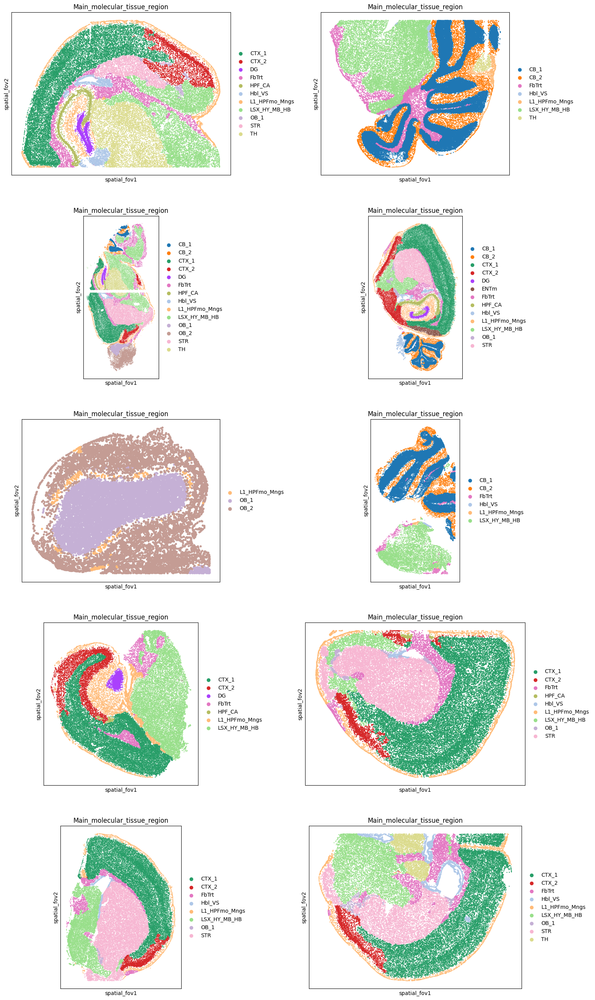

In [8]:
sq.pl.spatial_scatter(
    adata_10m,
    color=["Main_molecular_tissue_region"],
    library_key="sample",
#     palette=colors,
    library_id=library_subset,
    size=80,
    img=None,
    spatial_key="spatial_fov",
    figsize=(8, 6),
    alpha=1,
    ncols=2,
)

### Main_region_transferred_5nn

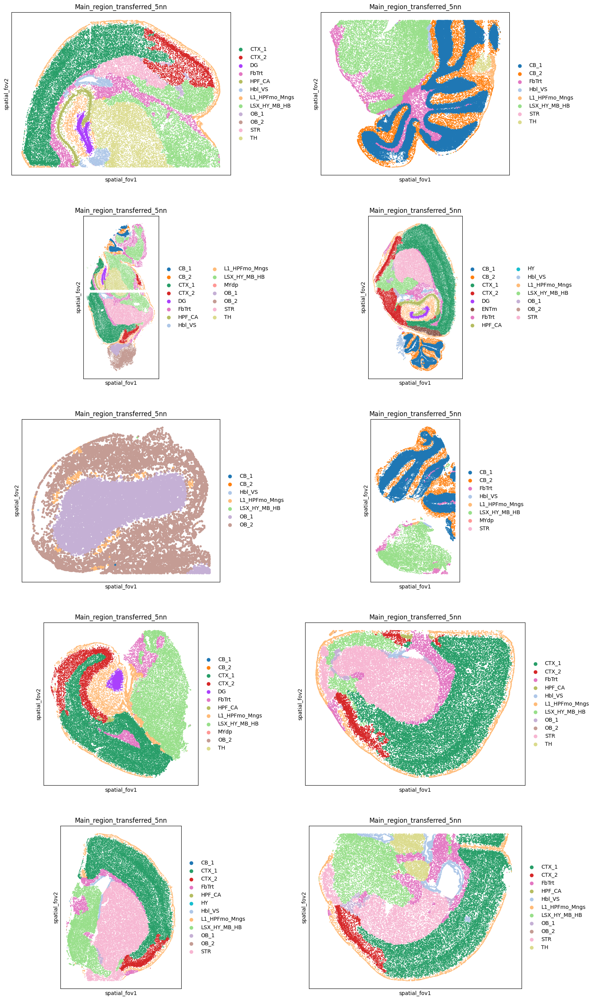

In [9]:
sq.pl.spatial_scatter(
    adata_10m,
    color=["Main_region_transferred_5nn"],
    library_key="sample",
#     palette=colors,
    library_id=library_subset,
    size=80,
    img=None,
    spatial_key="spatial_fov",
    figsize=(8, 6),
    alpha=1,
    ncols=2,
)

### Sub_molecular_tissue_region

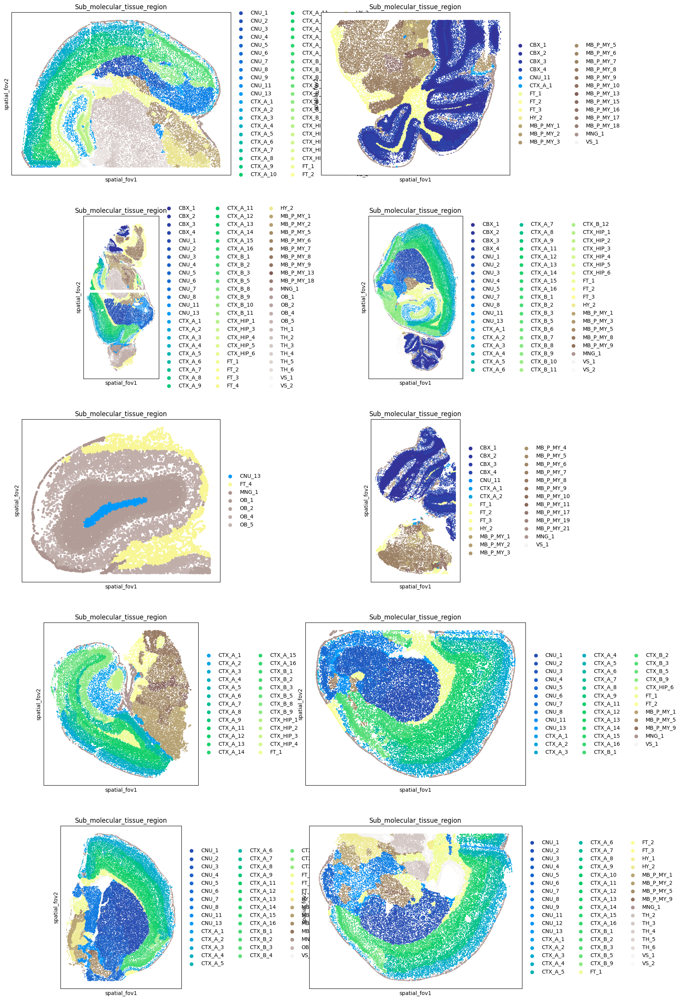

In [10]:
key = "Sub_molecular_tissue_region"

adata_10m.obs[key] = adata_10m.obs[key].astype("category")
cats = adata_10m.obs[key].cat.categories
n_cat = len(cats)

# - gist_ncar、hsv、terrain
cmap = plt.get_cmap("terrain", n_cat)
color_hex = [mcolors.to_hex(cmap(i)) for i in range(n_cat)]

adata_10m.uns[f"{key}_colors"] = color_hex

sq.pl.spatial_scatter(
    adata_10m,
    color=[key],
    library_key="sample",
    library_id=library_subset,
    size=80,
    img=None,
    spatial_key="spatial_fov",
    figsize=(8, 6),
    alpha=1,
    ncols=2,
)

### Sub_region_transferred_5nn

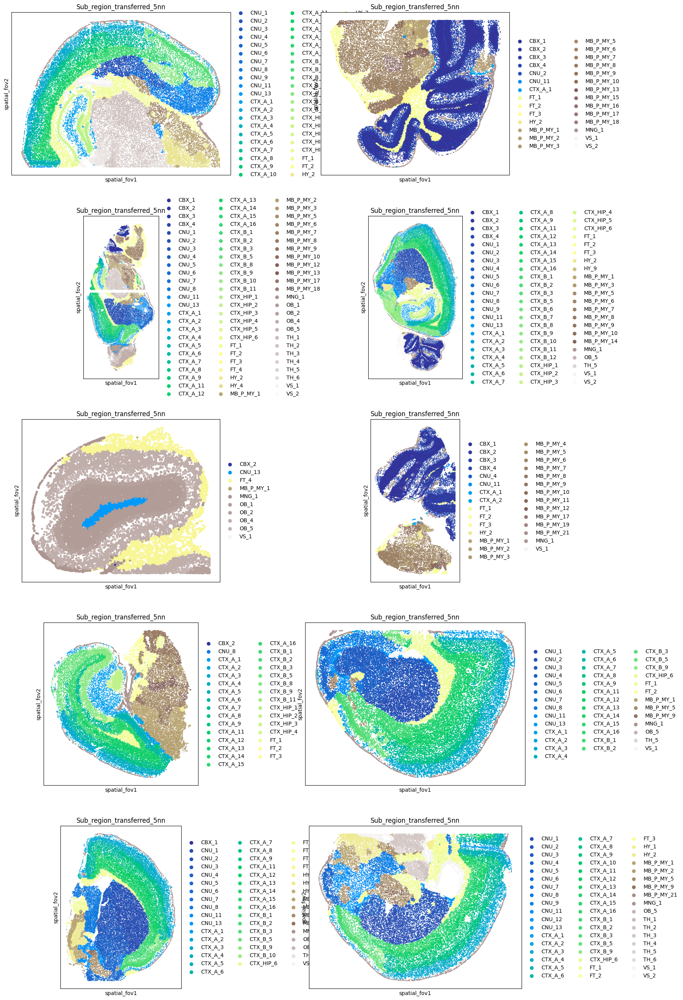

In [11]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

key = "Sub_region_transferred_5nn"

adata_10m.obs[key] = adata_10m.obs[key].astype("category")
cats = adata_10m.obs[key].cat.categories
n_cat = len(cats)

# - gist_ncar、hsv、terrain 
cmap = plt.get_cmap("terrain", n_cat)
color_hex = [mcolors.to_hex(cmap(i)) for i in range(n_cat)]

adata_10m.uns[f"{key}_colors"] = color_hex

sq.pl.spatial_scatter(
    adata_10m,
    color=[key],
    library_key="sample",
    library_id=library_subset,
    size=80,
    img=None,
    spatial_key="spatial_fov",
    figsize=(8, 6),
    alpha=1,
    ncols=2,
)
